In [1]:
from glob import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import pickle
import warnings
warnings.filterwarnings(action='ignore')

# 한글설정
from matplotlib import font_manager
f_path = '/Library/Fonts/NanumGothic.ttf'
font_manager.FontProperties(fname=f_path).get_name()
from matplotlib import rc
rc('font', family = 'NanumGothic')

# #지수표현 안나오게 하기
# pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.float_format', None)

import folium
from folium.plugins import MarkerCluster, MiniMap

* 제주도 2차 재난지원금 신청: 8. 24. ~ 10. 11.

"""


* YM : 기준년월 
* SIDO : 지역대분류명 
* SIGUNGU : 지역중분류명 
* FranClass : 소상공인구분 
* Type : 업종명 
* Time : 시간대 
* vTotalSpent : 총사용금액 
* DisSpent : 재난지원금 사용금액 
* NumOfSpent : 총 이용건수 
* NumOfDisSpent : 총 재난지원금 이용건수 
* POINT_X, POINT_Y : X,Y 좌표 
* Ts-DS : 총사용금액 - 재난지원금
* NTS-NDS : 총이용건수-총재난금액 이용건수
* Mts : 총사용금액/총이용건수 (의미없어보이지만)
* Mds : 재난지원금/재난지원금 이용건수
* Time_cut : 심야 새벽 오전 점심 오후 저녁 무승인거래


"""


In [2]:
# 기존에 저장했던 파일 불러오기
# Time을 str형식으로 지정안하고 불러오니 01,02와 1,2(숫자형식)가 섞여서 출력됨
df = pd.read_csv('./dacon_jeju.csv', sep=',', dtype = {"Time": str})
df=df.iloc[:,1:]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1119429 entries, 0 to 1119428
Data columns (total 18 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   OBJECTID       1119429 non-null  int64  
 1   YM             1119429 non-null  int64  
 2   SIDO           1119429 non-null  object 
 3   SIGUNGU        1119429 non-null  object 
 4   FranClass      1119429 non-null  object 
 5   Type           1119429 non-null  object 
 6   Time           1119429 non-null  object 
 7   TotalSpent     1119429 non-null  int64  
 8   DisSpent       1119429 non-null  int64  
 9   NumofSpent     1119429 non-null  int64  
 10  NumofDisSpent  1119429 non-null  int64  
 11  POINT_X        1119429 non-null  float64
 12  POINT_Y        1119429 non-null  float64
 13  TS-DS          1119429 non-null  int64  
 14  NTS-NDS        1119429 non-null  int64  
 15  Mts            1119429 non-null  float64
 16  Mds            1119429 non-null  float64
 17  Time_cut

In [3]:
df.head()

,OBJECTID,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,TS-DS,NTS-NDS,Mts,Mds,Time_cut
0,1,202006,제주특별자치도,제주시,영세,일반한식,00,502000,0,10,0,877005.9834,1.479766e+06,502000,10,50200.0,0.0,심야
1,2,202006,제주특별자치도,제주시,영세,단란주점,00,1520000,0,8,0,877005.7447,1.479816e+06,1520000,8,190000.0,0.0,심야
2,3,202006,제주특별자치도,제주시,중소1,편의점,00,482310,0,35,0,877056.6756,1.479616e+06,482310,35,13780.0,0.0,심야
3,4,202006,제주특별자치도,제주시,영세,편의점,00,38050,5450,3,1,877055.9593,1.479766e+06,32600,2,12683.0,5450.0,심야
4,5,202006,제주특별자치도,제주시,영세,일반한식,00,32000,32000,1,1,877055.4817,1.479866e+06,0,0,32000.0,32000.0,심야


In [4]:
with open('./data/jeju_uniq_data5.pickle','rb') as fr:
    df_5_add = pickle.load(fr)

df_5_add= df_5_add[['OBJECTID', 'lon', 'lat', 'lon_lat', 'dong']]

In [5]:
with open('./data/jeju_uniq_data6.pickle','rb') as fr:
    df_6_add = pickle.load(fr)

df_6_add= df_6_add[['OBJECTID', 'lon', 'lat', 'lon_lat', 'dong']]

with open('./data/jeju_uniq_data7.pickle','rb') as fr:
    df_7_add = pickle.load(fr)

df_7_add= df_7_add[['OBJECTID', 'lon', 'lat', 'lon_lat', 'dong']]

with open('./data/jeju_uniq_data8.pickle','rb') as fr:
    df_8_add = pickle.load(fr)

df_8_add= df_8_add[['OBJECTID', 'lon', 'lat', 'lon_lat', 'dong']]

In [6]:
df_5_add.head()

,OBJECTID,lon,lat,lon_lat,dong
0,1,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
1,4904,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
2,8569,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
3,11270,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
4,19122,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면


In [7]:
df_7_add.head()

,OBJECTID,lon,lat,lon_lat,dong
0,1,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
1,5076,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
2,19832,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
3,24086,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
4,30957,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면


In [8]:
df_dong = pd.concat([df_5_add,df_6_add,df_7_add,df_8_add], axis=0)
df_dong

,OBJECTID,lon,lat,lon_lat,dong
0,1,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
1,4904,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
2,8569,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
3,11270,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
4,19122,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면
...,...,...,...,...,...
280080,275532,126.53369851534627,33.49678916515772,126.53369851534627_33.49678916515772,이도이동
280081,275664,126.535342658025,33.4950054416331,126.535342658025_33.4950054416331,이도이동
280082,278935,126.65174159048293,33.27407883370635,126.65174159048293_33.27407883370635,남원읍
280083,279538,126.82818252032293,33.36422597166203,126.82818252032293_33.36422597166203,성산읍


In [9]:
df = pd.merge(df, df_dong, on='lon')
df

KeyError: 'lon'

In [17]:
df

,OBJECTID,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,TS-DS,NTS-NDS,Mts,Mds,Time_cut
0,1,202006,제주특별자치도,제주시,영세,일반한식,00,502000,0,10,0,877005.9834,1.479766e+06,502000,10,50200.0,0.0,심야
1,2,202006,제주특별자치도,제주시,영세,단란주점,00,1520000,0,8,0,877005.7447,1.479816e+06,1520000,8,190000.0,0.0,심야
2,3,202006,제주특별자치도,제주시,중소1,편의점,00,482310,0,35,0,877056.6756,1.479616e+06,482310,35,13780.0,0.0,심야
3,4,202006,제주특별자치도,제주시,영세,편의점,00,38050,5450,3,1,877055.9593,1.479766e+06,32600,2,12683.0,5450.0,심야
4,5,202006,제주특별자치도,제주시,영세,일반한식,00,32000,32000,1,1,877055.4817,1.479866e+06,0,0,32000.0,32000.0,심야
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1119424,280081,202008,제주특별자치도,제주시,영세,편의점,x,13700,0,2,0,950266.5976,1.502458e+06,13700,2,6850.0,0.0,무승인거래
1119425,280082,202008,제주특별자치도,제주시,영세,일반한식,x,56000,0,1,0,950317.5379,1.502258e+06,56000,1,56000.0,0.0,무승인거래
1119426,280083,202008,제주특별자치도,제주시,영세,일반한식,x,28000,0,1,0,950469.1585,1.501909e+06,28000,1,28000.0,0.0,무승인거래
1119427,280084,202008,제주특별자치도,제주시,중소1,중국음식,x,46000,0,3,0,950574.6388,1.500760e+06,46000,3,15333.0,0.0,무승인거래


In [18]:
with open('./data/jeju_uniq_data5.pickle','rb') as fr:
    df_5 = pickle.load(fr)
    
with open('./data/jeju_uniq_data6.pickle','rb') as fr:
    df_6 = pickle.load(fr)
with open('./data/jeju_uniq_data7.pickle','rb') as fr:
    df_7 = pickle.load(fr)
with open('./data/jeju_uniq_data8.pickle','rb') as fr:
    df_8 = pickle.load(fr)

In [19]:
df = pd.concat([df_5, df_6, df_7, df_8], axis=0)

In [20]:
# 7월에만 있는 X, Y는 없애 줌
df= df.drop(['X', 'Y'], axis=1)
# time의 시는 제거
df['Time']= df['Time'].str.replace('시', '')

In [21]:
def time_cut(x):
    if '06'> x >='02':
        return '새벽'
    elif '11'> x >= '06':
        return '오전'
    elif '15' > x >= '11':
        return '점심'
    elif '18' > x >= '15':
        return '오후'
    elif  '22'> x >= '18':
        return '저녁'
    else:
        return '심야'

In [22]:
df['Time_cut'] = df['Time'].apply(time_cut)
df.loc[df['Time']=='x', 'Time_cut'] ='무승인거래'

In [23]:
df.tail()

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut
280080,275532,275532,202008,제주특별자치도,제주시,영세,보습학원,x,200000,0,1,0,910239.7342,1.500966e+06,126.53369851534627,33.49678916515772,126.53369851534627_33.49678916515772,이도이동,무승인거래
280081,275664,275664,202008,제주특별자치도,제주시,영세,학원(회원제형태),x,220000,0,1,0,910390.6274,1.500767e+06,126.535342658025,33.4950054416331,126.535342658025_33.4950054416331,이도이동,무승인거래
280082,278935,278935,202008,제주특별자치도,서귀포시,영세,예체능학원,x,110000,0,1,0,921003.9820,1.476178e+06,126.65174159048293,33.27407883370635,126.65174159048293_33.27407883370635,남원읍,무승인거래
280083,279538,279538,202008,제주특별자치도,서귀포시,영세,기타가구,x,50000,0,1,0,937500.1674,1.486053e+06,126.82818252032293,33.36422597166203,126.82818252032293_33.36422597166203,성산읍,무승인거래
280084,279785,279785,202008,제주특별자치도,제주시,영세,기타숙박업,x,17470,0,2,0,941114.0531,1.503713e+06,126.86586853032782,33.52371304945294,126.86586853032782_33.52371304945294,구좌읍,무승인거래


<AxesSubplot:xlabel='Type', ylabel='TotalSpent'>

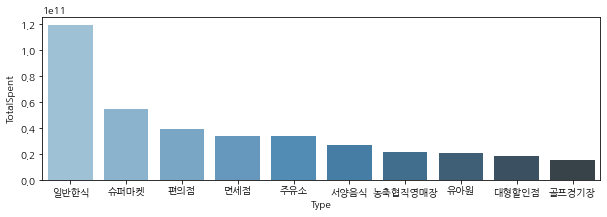

In [24]:
df_ty = df.groupby(['Type']).sum()
df_ty = df_ty.sort_values('TotalSpent', ascending=False)
df_ty = df_ty.reset_index()


plt.figure(figsize=(10,3))
sns.barplot(x='Type', y ='TotalSpent', data=df_ty[:10],palette = 'Blues_d')

In [25]:
df_cate= pd.read_csv('./data/jeju_(category).csv')
df_cate_temp = df_cate[['OBJECTID', 'Category']]

df_cate_temp[df_cate_temp['OBJECTID'] == 1]

,OBJECTID,Category
0,1,외식/주점
273183,1,외식/주점
555079,1,외식/주점
839344,1,외식/주점


In [26]:
df_temp = pd.merge(df,df_cate[['OBJECTID', 'Category']], on='OBJECTID' )
df_temp.drop_duplicates(keep='first')

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,Category
0,1,1,202005,제주특별자치도,제주시,영세,일반한식,00,363000,66500,10,2,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야,외식/주점
4,1,1,202006,제주특별자치도,제주시,영세,일반한식,00,502000,0,10,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야,외식/주점
8,1,1,202007,제주특별자치도,제주시,영세,일반한식,00,85500,0,4,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야,외식/주점
12,1,1,202008,제주특별자치도,제주시,영세,일반한식,00,249500,0,7,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야,외식/주점
16,4904,4904,202005,제주특별자치도,제주시,영세,일반한식,01,86500,0,3,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야,외식/주점
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4442654,283080,283080,202007,제주특별자치도,서귀포시,영세,일반한식,x,210000,0,1,0,927447.1604,1.477058e+06,126.72085202231753,33.282472206838406,126.72085202231753_33.282472206838406,남원읍,무승인거래,외식/주점
4442655,283561,283561,202007,제주특별자치도,서귀포시,영세,기타숙박업,x,420000,0,1,0,938325.4075,1.480709e+06,126.8374176866993,33.316074929565715,126.8374176866993_33.316074929565715,표선면,무승인거래,여행/숙박
4442656,283564,283564,202007,제주특별자치도,서귀포시,영세,헬스크럽,x,180000,0,1,0,938352.4466,1.485507e+06,126.83738053024116,33.35935333013854,126.83738053024116_33.35935333013854,성산읍,무승인거래,레저/스포츠
4442657,283697,283697,202007,제주특별자치도,제주시,중소1,농축수산품,x,3000,0,1,0,940062.3222,1.504158e+06,126.8545134611495,33.527665967051576,126.8545134611495_33.527665967051576,구좌읍,무승인거래,마트/편의점(유통)


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1119429 entries, 0 to 280084
Data columns (total 19 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   OBJECTID       1119429 non-null  int64  
 1   Field1         1119429 non-null  int64  
 2   YM             1119429 non-null  int64  
 3   SIDO           1119429 non-null  object 
 4   SIGUNGU        1119429 non-null  object 
 5   FranClass      1119429 non-null  object 
 6   Type           1119429 non-null  object 
 7   Time           1119429 non-null  object 
 8   TotalSpent     1119429 non-null  int64  
 9   DisSpent       1119429 non-null  int64  
 10  NumofSpent     1119429 non-null  int64  
 11  NumofDisSpent  1119429 non-null  int64  
 12  POINT_X        1119429 non-null  float64
 13  POINT_Y        1119429 non-null  float64
 14  lon            1119429 non-null  object 
 15  lat            1119429 non-null  object 
 16  lon_lat        1119429 non-null  object 
 17  dong     

In [28]:
1119429/3330702

0.33609401261355715

In [29]:
df.replace(dict.fromkeys(['택시', '기타교통수단', '통신기기'], '교통/통신'), inplace=True)
df.replace(dict.fromkeys(['대형할인점', '농축협직영매장', '농협하나로클럽', '편의점', '슈퍼마켓', '정육점', '기타유통업', '연쇄점', '상품권', '인삼제품', '홍삼제품', '농축수산품', '주류판매점', '기타건강식', '건강식품(회원제형태)'], '마트/편의점(유통)'), inplace=True)
df.replace(dict.fromkeys(['악기점', 'DVD음반테이프판매', '문화취미기타', '영화관', '티켓', '수족관', '화랑'], '영화/문화'), inplace=True)
df.replace(dict.fromkeys(['내의판매점', '양품점', '옷감직물', '귀금속', '기타직물', '스포츠의류', '가방', '정장', '악세사리', '기타잡화', '신발', '기타의류', '단체복', '아동의류', '캐쥬얼의류', '맞춤복점', '제화점', '인터넷Mall', '인터넷종합Mall'], '쇼핑/패션'), inplace=True)
df.replace(dict.fromkeys(['제과점', '스넥', '기타음료식품'], '카페/베이커리'), inplace=True)
df.replace(dict.fromkeys(['미용재료', '화장품', '피부미용실', '미용원', '이용원'], '뷰티'), inplace=True)
df.replace(dict.fromkeys(['구내매점', '단란주점', '주점', '서양음식', '일반한식', '일식회집', '중국음식',  '유흥주점', '칵테일바'], '외식/주점'), inplace=True)
df.replace(dict.fromkeys(['세탁소', '애완동물', '화원', '침구수예점', '성인용품점', '가전제품', '기타가구', '조명기구', '민예공예품', '주방용식기', '기타전기제품', '소프트웨어', '주방용구', '카페트커텐천막', '컴퓨터', '카메라', '일반가구', '정수기', '철제가구', '시계', '안경', '사우나', '안마스포츠마사지', '사진관', '인테리어', 'CATV'], '생활/기타'), inplace=True)
df.replace(dict.fromkeys(['완구점', '화방표구점', '문구용품', '일반서적', '출판인쇄물', '기타사무용', '사무기기', '전문서적', '정기간행물', '기타서적문구', '서적출판(회원제형태)'], '서점/문구'), inplace=True)
df.replace(dict.fromkeys(['기타보험', '손해보험'], '금융'), inplace=True)
df.replace(dict.fromkeys(['기념품점', '기타숙박업', '특급호텔', '2급호텔', '1급호텔', '콘도', '렌트카', '관광여행', '항공사', '여객선', '면세점'], '여행/숙박'), inplace=True)
df.replace(dict.fromkeys(['레져용품수리', '스포츠레져용품', '골프용품', '노래방', '당구장', '골프경기장', '볼링장', '골프연습장', '헬스크럽', '레져업소(회원제형태)', '기타레져업', '종합레져타운', '수영장', '테니스장', '기타회원제형태업소', ], '레저/스포츠'), inplace=True)
df.replace(dict.fromkeys(['유아원', '독서실', '보습학원', '기능학원', '기타교육', '외국어학원', '학원(회원제형태)', '예체능학원', '컴퓨터학원', '대학등록금', '학습지교육', '초중고교육기관'], '교육/육아'), inplace=True)
df.replace(dict.fromkeys(['주유소', '자동차정비', 'LPG', '세차장', '유류판매', '이륜차판매', '윤활유전문판매', '자동차시트타이어', '중고자동차', '수입자동차', '자동차부품', '주차장', '기타자동차서비스', '카인테리어', ], '주유/자동차'), inplace=True)
df.replace(dict.fromkeys(['약국', '종합병원', '기타의료기관및기기', '한약방', '제약회사', '의료용품', '건강진단', '한의원', '동물병원', '의원', '치과의원', '병원', '산후조리원', '치과병원'], '의료'), inplace=True)
df.replace(dict.fromkeys(['목재석재철물', '건축요업품', '골동품점', '기계공구', '기타건축자재', '보일러펌프', '페인트', '냉열기기', '유리', '과학기자재', '기타광학품', '기타연료', '중장비수리', ], '건설/제조'), inplace=True)
df.replace(dict.fromkeys(['기타농업관련', '비료농약사료종자', '농기계', '미곡상'], '농업'), inplace=True)
df.replace(dict.fromkeys(['사무서비스', '기타대인서비스', '화물운송', '보관창고업', '종합용역', '조세서비스', '가례서비스', '공공요금', '위탁급식업', '기타용역서비스', '기타수리서비스', '기타운송', '가정용품수리', '견인서비스', '부동산중개임대', '부동산분양', '신변잡화수리', '사무통신기기수리', '법률회계서비스', '사무서비스(회원제형태)', '정보서비스', '기타업종', '기타비영리유통'], '서비스/기타'), inplace=True)

In [30]:
df

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut
0,1,1,202005,제주특별자치도,제주시,영세,외식/주점,00,363000,66500,10,2,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야
1,4904,4904,202005,제주특별자치도,제주시,영세,외식/주점,01,86500,0,3,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야
2,8569,8569,202005,제주특별자치도,제주시,영세,외식/주점,02,208000,0,5,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,새벽
3,11270,11270,202005,제주특별자치도,제주시,영세,외식/주점,03,18000,0,1,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,새벽
4,19122,19122,202005,제주특별자치도,제주시,중소,의료,07,4800,0,2,0,877005.9834,1.479766e+06,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,오전
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280080,275532,275532,202008,제주특별자치도,제주시,영세,교육/육아,x,200000,0,1,0,910239.7342,1.500966e+06,126.53369851534627,33.49678916515772,126.53369851534627_33.49678916515772,이도이동,무승인거래
280081,275664,275664,202008,제주특별자치도,제주시,영세,교육/육아,x,220000,0,1,0,910390.6274,1.500767e+06,126.535342658025,33.4950054416331,126.535342658025_33.4950054416331,이도이동,무승인거래
280082,278935,278935,202008,제주특별자치도,서귀포시,영세,교육/육아,x,110000,0,1,0,921003.9820,1.476178e+06,126.65174159048293,33.27407883370635,126.65174159048293_33.27407883370635,남원읍,무승인거래
280083,279538,279538,202008,제주특별자치도,서귀포시,영세,생활/기타,x,50000,0,1,0,937500.1674,1.486053e+06,126.82818252032293,33.36422597166203,126.82818252032293_33.36422597166203,성산읍,무승인거래


In [31]:
df2 = pd.concat([df_5, df_6, df_7, df_8], axis=0)
# 7월에만 있는 X, Y는 없애 줌
df2= df2.drop(['X', 'Y'], axis=1)
# time의 시는 제거
df2['Time']= df2['Time'].str.replace('시', '')
df2['Time_cut'] = df2['Time'].apply(time_cut)
df2.loc[df['Time']=='x', 'Time_cut'] ='무승인거래'
df2.head()

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut
0,1,1,202005,제주특별자치도,제주시,영세,일반한식,00,363000,66500,10,2,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야
1,4904,4904,202005,제주특별자치도,제주시,영세,일반한식,01,86500,0,3,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,심야
2,8569,8569,202005,제주특별자치도,제주시,영세,일반한식,02,208000,0,5,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,새벽
3,11270,11270,202005,제주특별자치도,제주시,영세,일반한식,03,18000,0,1,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,새벽
4,19122,19122,202005,제주특별자치도,제주시,중소,한의원,07,4800,0,2,0,877005.9834,1479766.073,126.17889362710162,33.30231529076243,126.17889362710162_33.30231529076243,한경면,오전


In [32]:
df2['category'] = df['Type']

In [33]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1119429 entries, 0 to 280084
Data columns (total 20 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   OBJECTID       1119429 non-null  int64  
 1   Field1         1119429 non-null  int64  
 2   YM             1119429 non-null  int64  
 3   SIDO           1119429 non-null  object 
 4   SIGUNGU        1119429 non-null  object 
 5   FranClass      1119429 non-null  object 
 6   Type           1119429 non-null  object 
 7   Time           1119429 non-null  object 
 8   TotalSpent     1119429 non-null  int64  
 9   DisSpent       1119429 non-null  int64  
 10  NumofSpent     1119429 non-null  int64  
 11  NumofDisSpent  1119429 non-null  int64  
 12  POINT_X        1119429 non-null  float64
 13  POINT_Y        1119429 non-null  float64
 14  lon            1119429 non-null  object 
 15  lat            1119429 non-null  object 
 16  lon_lat        1119429 non-null  object 
 17  dong     

In [34]:
df2['dis/tot'] = round(df2['DisSpent'] / df2['TotalSpent'],1)

df2.sort_values('dis/tot', ascending = False)

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,...,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,category,dis/tot
111401,164793,164793,202006,제주특별자치도,서귀포시,중소,침구수예점,16,18000,170000,...,1,912919.6855,1.473590e+06,126.56519070778894,33.25011994226535,126.56519070778894_33.25011994226535,서귀동,오후,생활/기타,9.4
100133,104496,104496,202006,제주특별자치도,제주시,중소1,일반한식,13,3800,33000,...,4,911640.5524,1.500673e+06,126.54880591248356,33.49426212048044,126.54880591248356_33.49426212048044,이도이동,점심,외식/주점,8.7
222672,236750,236750,202005,제주특별자치도,제주시,영세,독서실,20,15000,90000,...,1,911353.3997,1.498023e+06,126.54597714099869,33.47033714962093,126.54597714099869_33.47033714962093,아라일동,저녁,교육/육아,6.0
52817,79865,79865,202005,제주특별자치도,서귀포시,일반,헬스크럽,12,100000,600000,...,1,907070.6205,1.473912e+06,126.50237587126347,33.252535695573414,126.50237587126347_33.252535695573414,강정동,점심,레저/스포츠,6.0
204263,202431,202431,202006,제주특별자치도,제주시,중소2,자동차시트타이어,18,42000,177000,...,1,911935.3795,1.501724e+06,126.55187603434769,33.50376456809342,126.55187603434769_33.50376456809342,건입동,저녁,주유/자동차,4.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38428,157537,157537,202005,제주특별자치도,제주시,일반,신발,16,10100,-29900,...,-1,906096.3890,1.499947e+06,126.48920667366582,33.48723948067243,126.48920667366582_33.48723948067243,연동,오후,쇼핑/패션,-3.0
130286,177587,177587,202005,제주특별자치도,제주시,영세,스포츠의류,17,38900,-144100,...,0,906147.0863,1.499797e+06,126.48976798822049,33.4858939627177,126.48976798822049_33.4858939627177,연동,오후,쇼핑/패션,-3.7
192011,115025,115025,202006,제주특별자치도,제주시,중소1,자동차정비,14,20000,-118000,...,0,904342.6184,1.500888e+06,126.47023097135138,33.49557177176241,126.47023097135138_33.49557177176241,도두일동,점심,주유/자동차,-5.9
152829,193152,193152,202006,제주특별자치도,서귀포시,영세,슈퍼마켓,18,9150,-63176,...,1,904421.8130,1.473900e+06,126.47394538722067,33.252190380265,126.47394538722067_33.252190380265,도순동,저녁,마트/편의점(유통),-6.9


In [35]:
df_nw = df2[df2['dong'].str.contains('남원')]
df_ps = df2[df2['dong'].str.contains('표선')]
df_ss = df2[df2['dong'].str.contains('성산')]

In [36]:
len(df_nw), len(df_ps), len(df_ss)

(20669, 22835, 35123)

,category,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,마트/편의점(유통),609595407,609595407,936502213,2792750240,314767253,136669,12363,4.289459e+09,6.849699e+09,398.4
1,외식/주점,1366187696,1366187696,1779475457,2359639133,140615173,70442,4677,8.152637e+09,1.301214e+10,568.1
2,레저/스포츠,97100033,97100033,144434642,2038478242,3318326,16900,132,6.618035e+08,1.058741e+09,26.7
3,여행/숙박,98963198,98963198,130698262,1475776065,3877600,19846,160,5.982584e+08,9.562164e+08,9.5
4,주유/자동차,125868513,125868513,211298799,1139296102,97908845,25715,1760,9.675806e+08,1.544819e+09,107.0


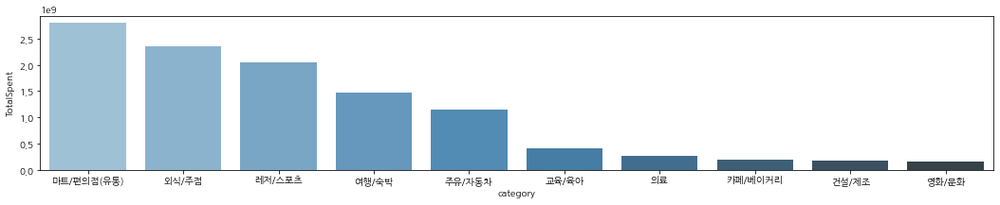

In [37]:
# 남원읍 업종에 따른 순위(총 금액)
df_nw_ty = df_nw.groupby(['category']).sum()
df_nw_ty = df_nw_ty.sort_values('TotalSpent', ascending=False)
df_nw_ty = df_nw_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='TotalSpent', data=df_nw_ty[:10],palette = 'Blues_d')
df_nw_ty.head()

,category,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,마트/편의점(유통),609595407,609595407,936502213,2792750240,314767253,136669,12363,4.289459e+09,6.849699e+09,398.4
1,외식/주점,1366187696,1366187696,1779475457,2359639133,140615173,70442,4677,8.152637e+09,1.301214e+10,568.1
2,주유/자동차,125868513,125868513,211298799,1139296102,97908845,25715,1760,9.675806e+08,1.544819e+09,107.0
3,여행/숙박,98963198,98963198,130698262,1475776065,3877600,19846,160,5.982584e+08,9.562164e+08,9.5
4,레저/스포츠,97100033,97100033,144434642,2038478242,3318326,16900,132,6.618035e+08,1.058741e+09,26.7


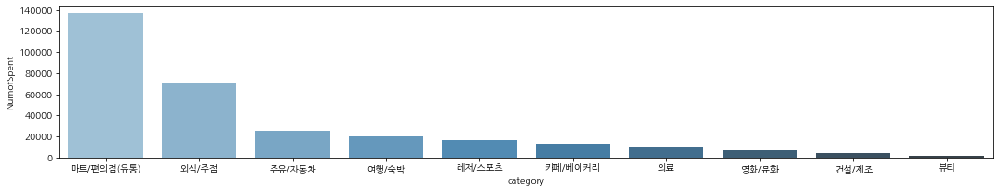

In [38]:
# 남원읍 업종에 따른 순위(총 사용횟수)
df_nw_ty = df_nw.groupby(['category']).sum()
df_nw_ty = df_nw_ty.sort_values('NumofSpent', ascending=False)
df_nw_ty = df_nw_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='NumofSpent', data=df_nw_ty[:10],palette = 'Blues_d')
df_nw_ty.head()

<AxesSubplot:xlabel='Time', ylabel='NumofSpent'>

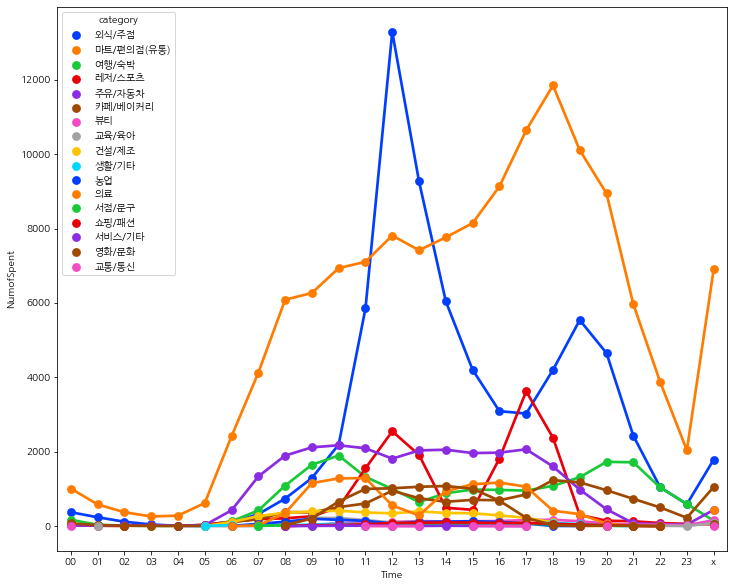

In [39]:
df_nw_time = df_nw.groupby(['category','Time']).sum()
df_nw_time = df_nw_time.sort_values('Time')
df_nw_time = df_nw_time.reset_index()

plt.figure(figsize=(12,10))
sns.pointplot(x='Time', y ='NumofSpent', data=df_nw_time, hue='category',  palette='bright')

In [40]:
# 17시에 레저 스포츠가 많은 이유는 골프장
df_nw[(df_nw['category'] =='레저/스포츠') & (df_nw['Time']=='17')].sort_values('TotalSpent', ascending = False)

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,...,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,category,dis/tot
122425,189177,189177,202005,제주특별자치도,서귀포시,일반,골프경기장,17,65595070,0,...,0,927857.0808,1.485407e+06,126.72458731668908,33.35779647707925,126.72458731668908_33.35779647707925,남원읍,오후,레저/스포츠,0.0
127680,187426,187426,202006,제주특별자치도,서귀포시,일반,골프경기장,17,56124604,0,...,0,927857.0808,1.485407e+06,126.72458731668908,33.35779647707925,126.72458731668908_33.35779647707925,남원읍,오후,레저/스포츠,0.0
128734,187858,187858,202007,제주특별자치도,서귀포시,일반,골프경기장,17,37272050,0,...,0,927857.0808,1.485407e+06,126.72458731668908,33.35779647707925,126.72458731668908_33.35779647707925,남원읍,오후,레저/스포츠,0.0
157526,188996,188996,202005,제주특별자치도,서귀포시,일반,골프경기장,17,27268500,0,...,0,926757.0703,1.485502e+06,126.71275736422531,33.358576157646226,126.71275736422531_33.358576157646226,남원읍,오후,레저/스포츠,0.0
184284,187262,187262,202006,제주특별자치도,서귀포시,일반,골프경기장,17,26735400,0,...,0,926757.0703,1.485502e+06,126.71275736422531,33.358576157646226,126.71275736422531_33.358576157646226,남원읍,오후,레저/스포츠,0.0
162722,189214,189214,202008,제주특별자치도,서귀포시,일반,골프경기장,17,26238000,0,...,0,926757.0703,1.485502e+06,126.71275736422531,33.358576157646226,126.71275736422531_33.358576157646226,남원읍,오후,레저/스포츠,0.0
127230,189389,189389,202008,제주특별자치도,서귀포시,일반,골프경기장,17,25930750,0,...,0,927857.0808,1.485407e+06,126.72458731668908,33.35779647707925,126.72458731668908_33.35779647707925,남원읍,오후,레저/스포츠,0.0
165563,187688,187688,202007,제주특별자치도,서귀포시,일반,골프경기장,17,23936600,0,...,0,926757.0703,1.485502e+06,126.71275736422531,33.358576157646226,126.71275736422531_33.358576157646226,남원읍,오후,레저/스포츠,0.0
227527,188880,188880,202005,제주특별자치도,서귀포시,중소2,골프경기장,17,23757200,0,...,0,924002.7458,1.486638e+06,126.68305964512793,33.368633652682014,126.68305964512793_33.368633652682014,남원읍,오후,레저/스포츠,0.0
184093,187144,187144,202006,제주특별자치도,서귀포시,중소2,골프경기장,17,18849000,0,...,0,924002.7458,1.486638e+06,126.68305964512793,33.368633652682014,126.68305964512793_33.368633652682014,남원읍,오후,레저/스포츠,0.0


In [41]:
df_nw_time = df_nw.groupby(['category','Time_cut']).sum()
df_nw_time = df_nw_time.sort_values('NumofSpent', ascending= False)
df_nw_time = df_nw_time.reset_index()
df_nw_time

,category,Time_cut,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,마트/편의점(유통),저녁,184386849,184386849,163827297,706556666,78508927,36870,3280,7.507302e+08,1.198157e+09,65.8
1,외식/주점,점심,287720040,287720040,580970713,874496224,59635150,34449,2406,2.661041e+09,4.248683e+09,207.8
2,마트/편의점(유통),점심,120544372,120544372,243821834,692947027,80593373,30100,3010,1.116359e+09,1.783476e+09,114.3
3,마트/편의점(유통),오후,154226023,154226023,185441982,671749262,87146499,27917,3080,8.490840e+08,1.356399e+09,80.5
4,마트/편의점(유통),오전,39507799,39507799,217561013,499413655,63098918,25829,2491,9.964104e+08,1.591285e+09,107.3
...,...,...,...,...,...,...,...,...,...,...,...,...
99,영화/문화,심야,521438,521438,404014,79000,0,2,0,1.846105e+06,2.952575e+06,0.0
100,의료,심야,261868,261868,202008,130000,0,1,0,9.274476e+05,1.476958e+06,0.0
101,교통/통신,저녁,238176,238176,202006,12000,0,1,0,9.270995e+05,1.476607e+06,0.0
102,건설/제조,새벽,16296,16296,202005,12000,0,1,0,9.272989e+05,1.476708e+06,0.0


In [42]:
df_nw_res = df_nw[df_nw['category']=='외식/주점']
df_nw_mart = df_nw[df_nw['category']=='마트/편의점(유통)']
df_nw_travel = df_nw[df_nw['category']=='여행/숙박']

In [43]:
map = folium.Map((33.32883036108394, 126.66491081686284), zoom_start= 12)

#남원읍 외식주점 서클 추가 (빨강)
for i in range(len(df_nw_res['lon'])):
    folium.Circle(list(df_nw_res.iloc[i][['lat','lon']]), radius=5, color = '#e41a1c',fill_color = '#e41a1c').add_to(map)
#남원읍 마트 서클추가(파랑)
for i in range(len(df_nw_mart['lon'])):
    folium.Circle(list(df_nw_mart.iloc[i][['lat','lon']]), radius=5, color = '#377eb8',fill_color = '#377eb8').add_to(map)
#남원읍 여행/숙박 서클추가(녹색)
for i in range(len(df_nw_travel['lon'])):
    folium.Circle(list(df_nw_travel.iloc[i][['lat','lon']]), radius=5, color = '#008000',fill_color = '#008000').add_to(map)
    
map   

<AxesSubplot:xlabel='category', ylabel='TotalSpent'>

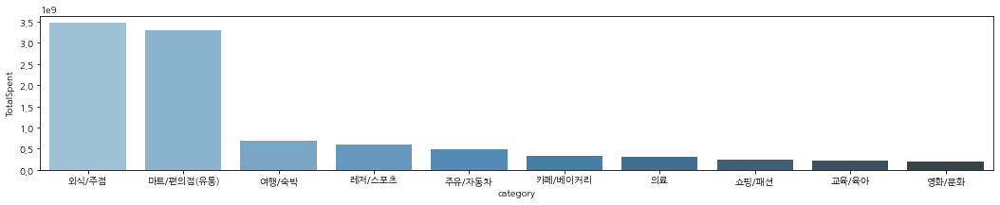

In [44]:
# 표선면 업종에 따른 순위(총 금액)
df_ps_ty = df_ps.groupby(['category']).sum()
df_ps_ty = df_ps_ty.sort_values('TotalSpent', ascending=False)
df_ps_ty = df_ps_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='TotalSpent', data=df_ps_ty[:10],palette = 'Blues_d')

<AxesSubplot:xlabel='category', ylabel='NumofSpent'>

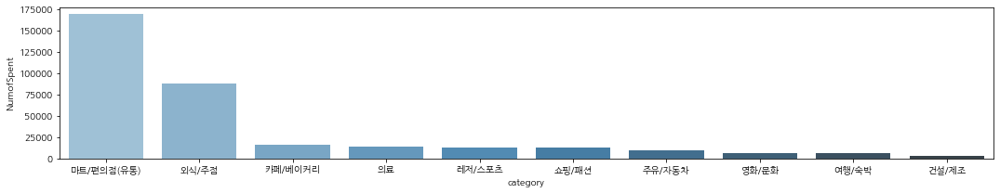

In [45]:
# 표선면 업종에 따른 순위(총 사용횟수)
df_ps_ty = df_ps.groupby(['category']).sum()
df_ps_ty = df_ps_ty.sort_values('NumofSpent', ascending=False)
df_ps_ty = df_ps_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='NumofSpent', data=df_ps_ty[:10],palette = 'Blues_d')

<AxesSubplot:xlabel='Time', ylabel='NumofSpent'>

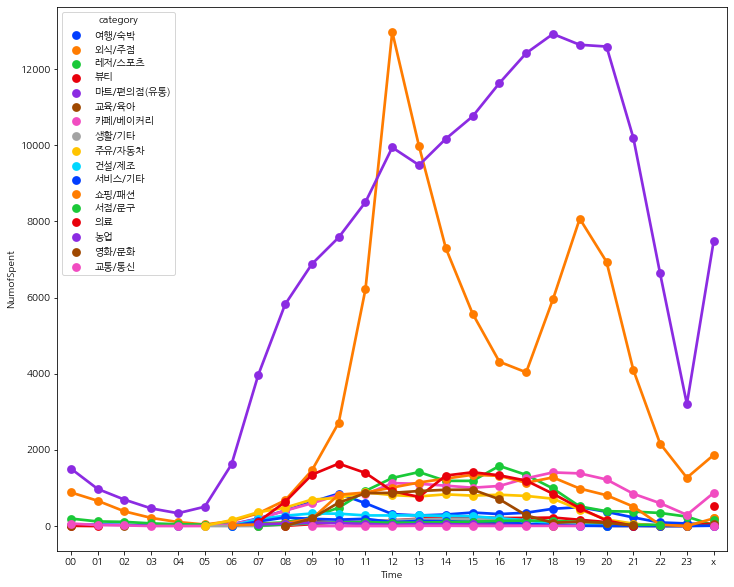

In [46]:
df_ps_time = df_ps.groupby(['category','Time']).sum()
df_ps_time = df_ps_time.sort_values('Time')
df_ps_time = df_ps_time.reset_index()

plt.figure(figsize=(12,10))
sns.pointplot(x='Time', y ='NumofSpent', data=df_ps_time, hue='category', palette='bright')

In [47]:
df_ps[(df_ps['Time']=='10') & (df_ps['category']=='뷰티')]

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,...,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,category,dis/tot
123674,54127,54127,202005,제주특별자치도,서귀포시,영세,미용원,10,48000,0,...,0,937871.0551,1.481656e+06,126.83247163457673,33.324594211817235,126.83247163457673_33.324594211817235,표선면,오전,뷰티,0.0
123676,54129,54129,202005,제주특별자치도,서귀포시,영세,화장품,10,336950,82000,...,3,937871.0551,1.481656e+06,126.83247163457673,33.324594211817235,126.83247163457673_33.324594211817235,표선면,오전,뷰티,0.2
123752,54135,54135,202005,제주특별자치도,서귀포시,영세,피부미용실,10,70000,70000,...,1,937870.8162,1.481706e+06,126.83246563086388,33.32504497597213,126.83246563086388_33.32504497597213,표선면,오전,뷰티,1.0
123851,54137,54137,202005,제주특별자치도,서귀포시,영세,미용원,10,47000,10000,...,1,937870.5773,1.481756e+06,126.83245962704808,33.32549574009343,126.83245962704808_33.32549574009343,표선면,오전,뷰티,0.2
123989,54145,54145,202005,제주특별자치도,서귀포시,영세,미용원,10,50000,50000,...,1,937870.3385,1.481806e+06,126.83245362419683,33.32594650508885,126.83245362419683_33.32594650508885,표선면,오전,뷰티,1.0
228801,54067,54067,202005,제주특별자치도,서귀포시,일반,미용원,10,155000,12000,...,1,937621.1584,1.481655e+06,126.82978692614462,33.32456898323741,126.82978692614462_33.32456898323741,표선면,오전,뷰티,0.1
249157,53953,53953,202005,제주특별자치도,서귀포시,영세,미용원,10,23000,0,...,0,934936.1548,1.489189e+06,126.8003969428714,33.392362292299744,126.8003969428714_33.392362292299744,표선면,오전,뷰티,0.0
249502,54086,54086,202005,제주특별자치도,서귀포시,영세,미용원,10,30000,0,...,0,937719.2060,1.482055e+06,126.8308127115673,33.328185194655894,126.8308127115673_33.328185194655894,표선면,오전,뷰티,0.0
249518,54094,54094,202005,제주특별자치도,서귀포시,영세,미용원,10,113000,13000,...,1,937770.1409,1.481856e+06,126.83137371417251,33.32638718382853,126.83137371417251_33.32638718382853,표선면,오전,뷰티,0.1
128798,54314,54314,202006,제주특별자치도,서귀포시,일반,미용원,10,13000,0,...,0,937821.3146,1.481606e+06,126.83194069842112,33.32413840552751,126.83194069842112_33.32413840552751,표선면,오전,뷰티,0.0


In [48]:
df_ps_cafe = df_ps[df_ps['category']=='카페/베이커리']
df_ps_hos = df_ps[df_ps['category']=='의료']
df_ps_cul = df_ps[df_ps['category']=='영화/문화']

In [49]:
map = folium.Map((33.35537014137845, 126.76519985689583), zoom_start= 12)

#표선면 카페 서클 추가 (빨강)
for i in range(len(df_ps_cafe['lon'])):
    folium.Circle(list(df_ps_cafe.iloc[i][['lat','lon']]), radius=5, color = '#e41a1c',fill_color = '#e41a1c').add_to(map)
#표선면 의료 서클추가(파랑)
for i in range(len(df_ps_hos['lon'])):
    folium.Circle(list(df_ps_hos.iloc[i][['lat','lon']]), radius=5, color = '#377eb8',fill_color = '#377eb8').add_to(map)
#표선면 영화/문화 서클추가(녹색)
for i in range(len(df_ps_cul['lon'])):
    folium.Circle(list(df_ps_cul.iloc[i][['lat','lon']]), radius=5, color = '#008000',fill_color = '#008000').add_to(map)
    
map   

<AxesSubplot:xlabel='category', ylabel='TotalSpent'>

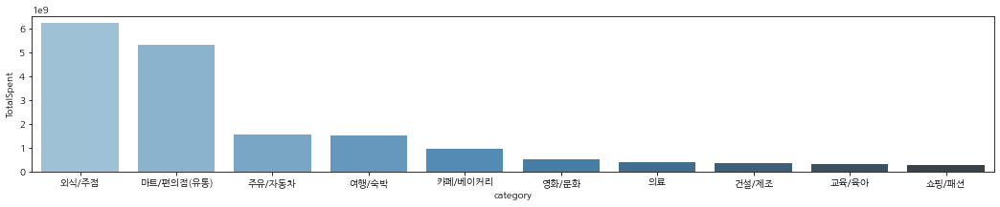

In [50]:
# 성산읍 업종에 따른 순위(총 금액)
df_ss_ty = df_ss.groupby(['category']).sum()
df_ss_ty = df_ss_ty.sort_values('TotalSpent', ascending=False)
df_ss_ty = df_ss_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='TotalSpent', data=df_ss_ty[:10],palette = 'Blues_d')

<AxesSubplot:xlabel='category', ylabel='NumofSpent'>

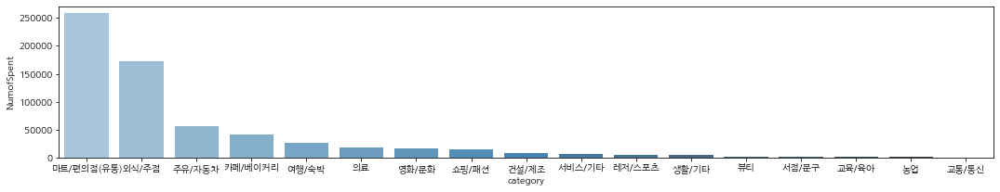

In [51]:
# 성산읍 업종에 따른 순위(총 사용횟수)
df_ss_ty = df_ss.groupby(['category']).sum()
df_ss_ty = df_ss_ty.sort_values('NumofSpent', ascending=False)
df_ss_ty = df_ss_ty.reset_index()


plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='NumofSpent', data=df_ss_ty,palette = 'Blues_d')

<AxesSubplot:xlabel='Time', ylabel='NumofSpent'>

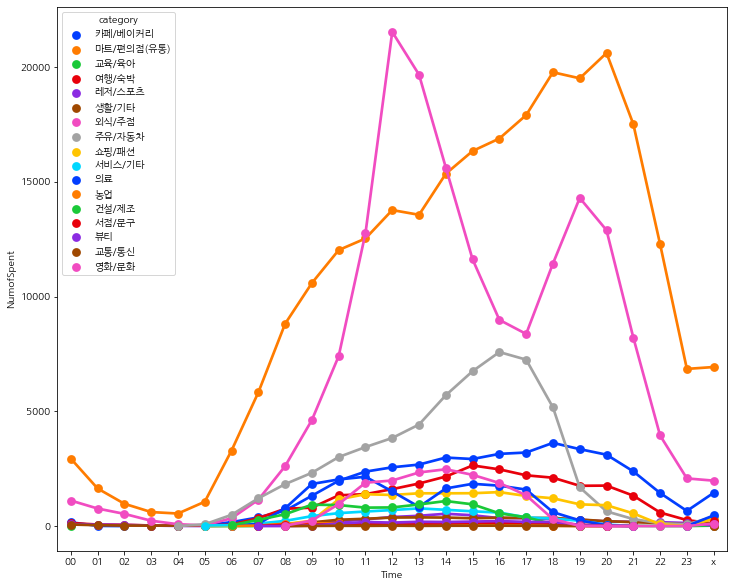

In [52]:
df_ss_time = df_ss.groupby(['category','Time']).sum()
df_ss_time = df_ss_time.sort_values('Time')
df_ss_time = df_ss_time.reset_index()

plt.figure(figsize=(12,10))


sns.pointplot(x='Time', y ='NumofSpent', data=df_ss_time, hue='category',  palette='bright')

In [53]:
df_ss_gas[df_ss_gas['Time'] =='16'].sort_values('TotalSpent', ascending = False)

NameError: name 'df_ss_gas' is not defined

In [54]:
df_ss_gas = df_ss[df_ss['category']=='주유/자동차']
df_ss_cafe = df_ss[df_ss['category']=='카페/베이커리']
df_ss_cul = df_ss[df_ss['category']=='영화/문화']
df_ss_hos = df_ss[df_ss['category']=='의료']

In [55]:
map = folium.Map((33.44645881722528, 126.8494622395825), zoom_start= 12)

#성산읍 주유/자동차 서클 추가 (빨강)
for i in range(len(df_ss_gas['lon'])):
    folium.Circle(list(df_ss_gas.iloc[i][['lat','lon']]), radius=5, color = '#e41a1c',fill_color = '#e41a1c').add_to(map)
#성산읍 카페 서클추가(파랑)
for i in range(len(df_ss_cafe['lon'])):
    folium.Circle(list(df_ss_cafe.iloc[i][['lat','lon']]), radius=5, color = '#377eb8',fill_color = '#377eb8').add_to(map)
#성산읍 영화/문화 서클추가(녹색)
for i in range(len(df_ss_cul['lon'])):
    folium.Circle(list(df_ss_cul.iloc[i][['lat','lon']]), radius=5, color = '#008000',fill_color = '#008000').add_to(map)

#성산읍 의료 서클추가(진한노랑)
for i in range(len(df_ss_hos['lon'])):
    folium.Circle(list(df_ss_hos.iloc[i][['lat','lon']]), radius=5, color = '#ffb90f',fill_color = '#ffb90f').add_to(map)
    
map   

In [56]:
df2.to_csv('./data/jeju_add_category_20201221.csv')

In [57]:
df2['dis/tot'] = round(df2['DisSpent'] / df2['TotalSpent'],1)
df2['count']=1
df2.sort_values('dis/tot', ascending = False)

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,...,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,category,dis/tot,count
111401,164793,164793,202006,제주특별자치도,서귀포시,중소,침구수예점,16,18000,170000,...,912919.6855,1.473590e+06,126.56519070778894,33.25011994226535,126.56519070778894_33.25011994226535,서귀동,오후,생활/기타,9.4,1
100133,104496,104496,202006,제주특별자치도,제주시,중소1,일반한식,13,3800,33000,...,911640.5524,1.500673e+06,126.54880591248356,33.49426212048044,126.54880591248356_33.49426212048044,이도이동,점심,외식/주점,8.7,1
222672,236750,236750,202005,제주특별자치도,제주시,영세,독서실,20,15000,90000,...,911353.3997,1.498023e+06,126.54597714099869,33.47033714962093,126.54597714099869_33.47033714962093,아라일동,저녁,교육/육아,6.0,1
52817,79865,79865,202005,제주특별자치도,서귀포시,일반,헬스크럽,12,100000,600000,...,907070.6205,1.473912e+06,126.50237587126347,33.252535695573414,126.50237587126347_33.252535695573414,강정동,점심,레저/스포츠,6.0,1
204263,202431,202431,202006,제주특별자치도,제주시,중소2,자동차시트타이어,18,42000,177000,...,911935.3795,1.501724e+06,126.55187603434769,33.50376456809342,126.55187603434769_33.50376456809342,건입동,저녁,주유/자동차,4.2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38428,157537,157537,202005,제주특별자치도,제주시,일반,신발,16,10100,-29900,...,906096.3890,1.499947e+06,126.48920667366582,33.48723948067243,126.48920667366582_33.48723948067243,연동,오후,쇼핑/패션,-3.0,1
130286,177587,177587,202005,제주특별자치도,제주시,영세,스포츠의류,17,38900,-144100,...,906147.0863,1.499797e+06,126.48976798822049,33.4858939627177,126.48976798822049_33.4858939627177,연동,오후,쇼핑/패션,-3.7,1
192011,115025,115025,202006,제주특별자치도,제주시,중소1,자동차정비,14,20000,-118000,...,904342.6184,1.500888e+06,126.47023097135138,33.49557177176241,126.47023097135138_33.49557177176241,도두일동,점심,주유/자동차,-5.9,1
152829,193152,193152,202006,제주특별자치도,서귀포시,영세,슈퍼마켓,18,9150,-63176,...,904421.8130,1.473900e+06,126.47394538722067,33.252190380265,126.47394538722067_33.252190380265,도순동,저녁,마트/편의점(유통),-6.9,1


In [58]:
df3 = df2[['OBJECTID', 'YM', 'SIGUNGU', 'FranClass', 'Type',
       'Time', 'TotalSpent', 'DisSpent', 'NumofSpent', 'NumofDisSpent',
       'lon', 'lat', 'lon_lat', 'dong', 'Time_cut',
       'category', 'dis/tot', 'count']]

In [59]:
df3 = df3.sort_values('dis/tot', ascending = False)
df3.to_csv('./df3.csv')

In [60]:
df3_group = df3.groupby('Type').mean().sort_values('dis/tot', ascending = False)
df3_group.reset_index(inplace=True)
df3_group.head()

,Type,OBJECTID,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,dis/tot,count
0,정보서비스,77719.250000,202007.000000,282050.000000,6250.000000,1.000000,0.250000,0.250000,1.0
1,유류판매,110626.006410,202006.014423,798033.383013,122833.591346,2.600962,0.625000,0.220513,1.0
2,미곡상,117861.423602,202006.401242,196780.409938,21388.211180,1.972671,0.316770,0.158758,1.0
3,인삼제품,108761.125000,202006.321429,107526.785714,10708.214286,1.250000,0.250000,0.157143,1.0
4,기타직물,119548.976190,202006.547619,144833.571429,17202.619048,1.404762,0.190476,0.152381,1.0


<AxesSubplot:xlabel='Type', ylabel='dis/tot'>

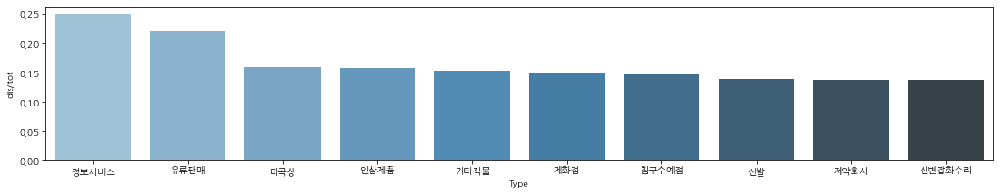

In [61]:
# 총사용금액대비 재닌금액 사용 비율이 높은 업종
plt.figure(figsize=(18,3))
sns.barplot(x='Type', y ='dis/tot', data=df3_group[:10],palette = 'Blues_d')

In [62]:
df4_group = df3.groupby('category').sum().sort_values('dis/tot', ascending = False)
df4_group.reset_index(inplace=True)
df4_group.head()

,category,OBJECTID,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,dis/tot,count
0,외식/주점,64765918034,86957947660,180936210427,8046522007,5736780,287149,21884.1,430471
1,마트/편의점(유통),23688833814,37962477962,168424415308,12982778807,8884893,569766,12261.3,187927
2,카페/베이커리,11314088712,15645809326,21876387824,1263799419,1395402,79626,5193.0,77452
3,뷰티,7034850971,9809031413,8407837270,632812727,184936,14690,4149.4,48558
4,생활/기타,6192702926,9452890888,19445888361,1332044658,254008,19730,4013.6,46795


<AxesSubplot:xlabel='category', ylabel='dis/tot'>

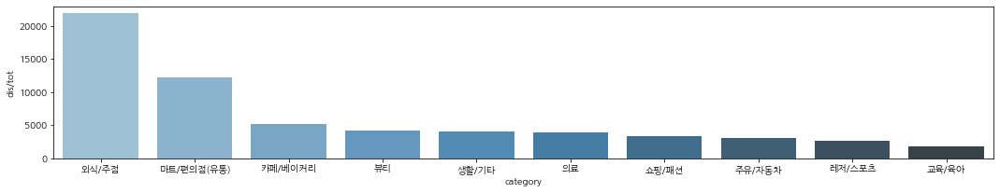

In [63]:
# 총사용금액대비 재닌금액 사용 비율이 높은 업종(카테고리)
plt.figure(figsize=(18,3))
sns.barplot(x='category', y ='dis/tot', data=df4_group[:10],palette = 'Blues_d')

In [64]:
df_nw_group = df_nw.groupby('Type').mean().sort_values('dis/tot', ascending = False)
df_nw_group.reset_index(inplace=True)
df_nw_group.head(5)

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,주방용구,39275.000000,39275.000000,202005.000000,600000.000000,600000.000000,1.000000,1.000000,918149.492800,1.477364e+06,1.000000
1,종합용역,134592.666667,134592.666667,202006.666667,116333.333333,47666.666667,1.000000,0.333333,917829.941367,1.477995e+06,0.333333
2,침구수예점,160691.630435,160691.630435,202006.326087,87365.434783,30433.478261,1.304348,0.391304,927014.870898,1.476573e+06,0.313043
3,신발,152751.125000,152751.125000,202006.250000,24541.666667,4708.333333,1.208333,0.291667,927299.133000,1.476658e+06,0.229167
4,안경,142561.392857,142561.392857,202006.392857,174535.714286,27142.857143,1.535714,0.357143,927248.915700,1.476707e+06,0.221429


<AxesSubplot:xlabel='Type', ylabel='dis/tot'>

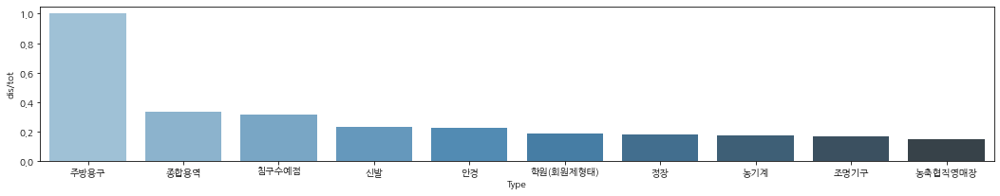

In [65]:
#남원읍 총사용금액대비 재난지원금 사용이 높은 업종
plt.figure(figsize=(18,3))
sns.barplot(x='Type', y ='dis/tot', data=df_nw_group[:10],palette = 'Blues_d')

In [66]:
df_ps_group = df_ps.groupby('Type').mean().sort_values('dis/tot', ascending = False)
df_ps_group.reset_index(inplace=True)
df_ps_group.head(5)

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,의료용품,163642.538462,163642.538462,202005.923077,252000.000000,73000.000000,1.538462,0.692308,937570.940200,1.481705e+06,0.384615
1,비료농약사료종자,98666.074074,98666.074074,202006.037037,201374.074074,50465.555556,1.888889,0.629630,937650.649852,1.481294e+06,0.311111
2,사우나,51260.076923,51260.076923,202006.076923,125384.615385,20769.230769,1.384615,0.230769,937771.574200,1.481556e+06,0.230769
3,신발,142522.564103,142522.564103,202006.384615,61846.153846,15751.538462,2.692308,0.512821,937870.816200,1.481706e+06,0.228205
4,홍삼제품,144506.073171,144506.073171,202006.487805,527245.512195,114047.317073,2.536585,0.658537,937920.556700,1.481756e+06,0.212195


<AxesSubplot:xlabel='Type', ylabel='dis/tot'>

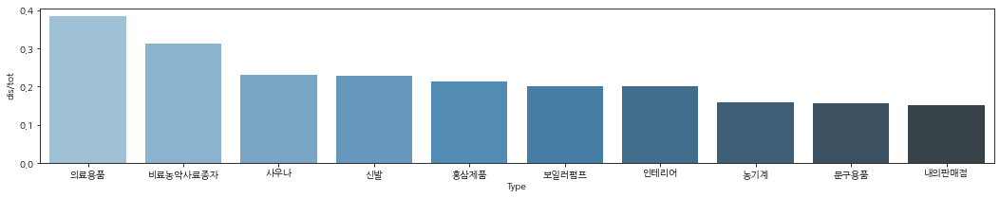

In [67]:
#표선면 총사용금액대비 재난지원금 사용이 높은 업종
plt.figure(figsize=(18,3))
sns.barplot(x='Type', y ='dis/tot', data=df_ps_group[:10],palette = 'Blues_d')

In [68]:
df_ss_group = df_ss.groupby('Type').sum().sort_values('dis/tot', ascending = False)
df_ss_group.reset_index(inplace=True)
df_ss_group.head(5)

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,일반한식,1790278804,1790278804,2367516527,4554157235,121164044,112602,3400,1.107898e+10,1.751925e+10,439.2
1,편의점,436216615,436216615,671065693,1288044238,42359282,151589,4270,3.140487e+09,4.965185e+09,108.2
2,서양음식,511792625,511792625,690054390,672378960,13816797,42752,879,3.227301e+09,5.103494e+09,87.4
3,슈퍼마켓,163562169,163562169,240387748,1684920101,108757870,57528,4233,1.124663e+09,1.778031e+09,73.3
4,농축수산품,227146260,227146260,314120188,555953731,17357250,8337,236,1.468573e+09,2.323217e+09,36.5


<AxesSubplot:xlabel='Type', ylabel='dis/tot'>

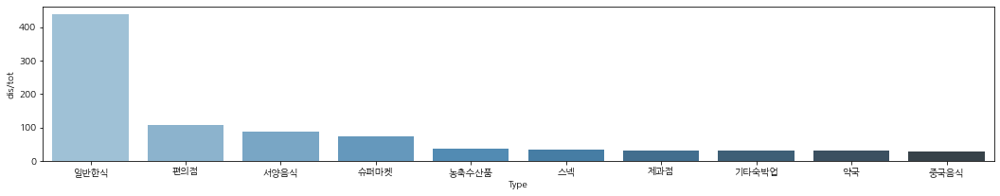

In [69]:
#성산읍 총사용금액대비 재난지원금 사용이 높은 업종
plt.figure(figsize=(18,3))
sns.barplot(x='Type', y ='dis/tot', data=df_ss_group[:10],palette = 'Blues_d')

In [70]:
df_ss_group[df_ss_group['Type']=='세차장']

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
65,세차장,355264,355264,606021,310000,40000,3,1,2.835590e+06,4.489757e+06,1.0


In [71]:
df_ss_group = df_ss.groupby('Type').mean().sort_values('NumofDisSpent', ascending = False)
df_ss_group.reset_index(inplace=True)
df_ss_group.head(10)

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
0,농축협직영매장,128847.909091,128847.909091,202006.527273,1.039206e+07,765679.993939,237.933333,20.181818,945111.492904,1.493827e+06,0.096364
1,기타음료식품,151780.407514,151780.407514,202006.705202,1.610102e+06,135264.537572,42.817919,3.583815,944931.680886,1.495163e+06,0.047688
2,슈퍼마켓,137447.200840,137447.200840,202006.510924,1.415899e+06,91393.168067,48.342857,3.557143,945094.806463,1.494144e+06,0.061597
3,주유소,127511.619403,127511.619403,202006.500000,2.742830e+06,154662.601990,64.126866,3.104478,943515.830111,1.492292e+06,0.048259
4,약국,130027.363344,130027.363344,202006.530547,5.912868e+05,67400.401929,33.546624,3.093248,945941.460331,1.495678e+06,0.100643
5,목재석재철물,109762.203252,109762.203252,202006.552846,1.225602e+06,99206.552846,29.849593,2.878049,945683.008785,1.496184e+06,0.070325
6,의원,118825.446945,118825.446945,202006.504823,4.324787e+05,35725.138264,18.073955,1.781350,945575.110311,1.495396e+06,0.088424
7,문구용품,132974.140351,132974.140351,202006.491228,3.066709e+05,19331.333333,25.666667,1.649123,945602.546400,1.495338e+06,0.075439
8,기타농업관련,107152.531915,107152.531915,202006.510638,9.363247e+05,106189.574468,12.957447,1.468085,945303.866000,1.495087e+06,0.095745
9,기타잡화,141410.676190,141410.676190,202006.574603,4.271860e+05,15344.834921,40.390476,1.406349,946520.438388,1.496168e+06,0.025079


In [72]:
df_ss_group[df_ss_group['Type']=='사무서비스']

,Type,OBJECTID,Field1,YM,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,dis/tot
35,사무서비스,122930.909091,122930.909091,202006.0,57090.909091,22909.090909,1.090909,0.363636,945651.3278,1.495588e+06,0.272727


In [73]:
df_nw = df2[df2['dong'].str.contains('남원')]
df_ps = df2[df2['dong'].str.contains('표선')]
df_ss = df2[df2['dong'].str.contains('성산')]

In [80]:
def df_time(a,b,c):
    """a는 동이름 중 하나를 입력
    b는 DisSpent or TotalSpent
    c는 시간을 문자열로"""
    df_temp= df2[df2['dong']==a].groupby(['Time','Type'])[b].sum()
    df_temp=pd.DataFrame(df_temp).sort_values(b, ascending=False)
    df_temp.reset_index(inplace=True)
    return df_temp[df_temp['Time']==c].reset_index().head(15)

In [81]:
# 전체 시간별, 남원읍 상위 15개 총사용금액을 보여줌  
df_total=[]
for i in range(24):
    if i < 10:
        i= '0'+ str(i)
        df_temp = df_time('남원읍', 'TotalSpent', i)
        df_total.append(df_temp)
    else:
        df_temp = df_time('남원읍', 'TotalSpent', str(i))
        df_total.append(df_temp)

pd.options.display.max_columns = len(pd.concat(df_total, axis=1).drop(['index'], axis=1).columns)    
pd.concat(df_total, axis=1).drop(['index'], axis=1)

,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent
0,00,유흥주점,14135000,01,유흥주점,12560000,02,유흥주점,9211000.0,03,편의점,2341480.0,04,편의점,2444480.0,05,콘도,8532755,06,콘도,18923005,07,주유소,48773881,08,콘도,76518932,09,콘도,138217452,10,콘도,187285303,11,골프경기장,191513334,12,골프경기장,294925680,13,골프경기장,230403603,14,농축협직영매장,95135836,15,콘도,122208168,16,골프경기장,219213481,17,골프경기장,393002474,18,골프경기장,267106162,19,일반한식,215436600,20,일반한식,216883930,21,일반한식,88392500,22,편의점,34468050,23,편의점,20758510
1,00,단란주점,12800000,01,단란주점,10420010,02,편의점,3844150.0,03,유흥주점,1690000.0,04,콘도,1827030.0,05,편의점,5910910,06,편의점,17183880,07,콘도,27780000,08,주유소,62403216,09,농축협직영매장,76774885,10,농축협직영매장,87837248,11,콘도,124695914,12,일반한식,264725711,13,일반한식,161885960,14,일반한식,90028050,15,농축협직영매장,105597130,16,농축협직영매장,129415084,17,농축협직영매장,148815710,18,농축협직영매장,152149610,19,농축협직영매장,104286630,20,콘도,74285838,21,콘도,52710927,22,콘도,28577592,23,단란주점,16688000
2,00,편의점,10439680,01,편의점,6296080,02,단란주점,3690000.0,03,주점,1064000.0,04,일반한식,455000.0,05,골프경기장,1086680,06,주유소,15790960,07,편의점,23667580,08,농축협직영매장,57367090,09,주유소,72242883,10,주유소,80342624,11,일반한식,97468700,12,농축협직영매장,76712502,13,농축협직영매장,82410568,14,골프경기장,79763262,15,골프경기장,71641588,16,콘도,118090444,17,주유소,79294061,18,일반한식,107181713,19,콘도,52349921,20,농축협직영매장,72960910,21,편의점,46655930,22,일반한식,27045250,23,유흥주점,15040000
3,00,콘도,5547970,01,주점,3173500,02,주점,1526500.0,03,단란주점,550000.0,04,골프경기장,373491.0,05,주유소,939017,06,슈퍼마켓,11656470,07,농축협직영매장,22514162,08,편의점,27561870,09,유아원,64605210,10,골프경기장,66655759,11,농축협직영매장,88237206,12,주유소,62943321,13,주유소,76495326,14,콘도,72949587,15,주유소,70689520,16,주유소,72510768,17,콘도,74077672,18,주유소,61769171,19,편의점,49805280,20,편의점,50951050,21,일식회집,29310500,22,단란주점,15515000,23,콘도,10005814
4,00,주점,3559300,01,서양음식,1741000,02,서양음식,1272500.0,03,서양음식,464000.0,04,주유소,301600.0,05,스포츠레져용품,839000,06,골프경기장,11262850,07,골프경기장,20472550,08,골프경기장,17439104,09,골프경기장,29878828,10,유아원,52494350,11,주유소,76055226,12,콘도,58980144,13,서양음식,51384470,14,주유소,70743367,15,일반한식,51614950,16,일반한식,31961000,17,일반한식,50441300,18,콘도,56465282,19,주유소,38609093,20,일식회집,42552500,21,슈퍼마켓,19231500,22,유흥주점,14435000,23,일반한식,9018400
5,00,일반한식,3051500,01,기타숙박업,1416000,02,기타숙박업,667000.0,03,주유소,412554.0,04,기타숙박업,246000.0,05,슈퍼마켓,496660,06,목재석재철물,3374300,07,슈퍼마켓,13554890,08,목재석재철물,15923500,09,편의점,23555750,10,일반한식,27058516,11,유아원,42594170,12,서양음식,51022410,13,농축수산품,34447556,14,서양음식,45059120,15,서양음식,34919870,16,편의점,28693740,17,편의점,33229370,18,편의점,44338130,19,일식회집,30747000,20,서양음식,24138980,21,단란주점,16610000,22,스넥,9440200,23,스넥,5929700
6,00,기타숙박업,2846500,01,일반한식,1279500,02,일반한식,527000.0,03,일반한식,274000.0,04,유흥주점,150000.0,05,헬스크럽,260000,06,골프용품,2253000,07,목재석재철물,8998700,08,슈퍼마켓,9850560,09,농축수산품,20282100,10,치과의원,26268590,11,편의점,25816200,12,편의점,31044970,13,콘도,29855991,14,농축수산품,27764560,15,편의점,27090940,16,농축수산품,27527220,17,슈퍼마켓,29677480,18,슈퍼마켓,33540640,19,골프경기장,29581923,20,슈퍼마켓,22961280,21,서양음식,13229580,22,일식회집,9062000,23,주점,4471600
7,00,서양음식,2450500,01,노래방,647000,02,주유소,462132.0,03,기타숙박업,257000.0,04,주점,108000.0,05,유아원,240000,06,일반한식,1446300,07,농축수산품,6296200,08,비료농약사료종자,9466510,09,비료농약사료종자,17094935,10,편의점,23556600,11,서양음식,22001610,12,농축수산품,27132969,13,편의점,28986180,14,편의점,26754180,15,농축수산품,25592440,16,서양음식,26992020,17,농축수산품,26952131,18,서양음식,23214280,19,서양음식,27156310,20,주유소,18783176,21,스넥,11541600,22,슈퍼마켓,7338880,23,기타숙박업,3973126
8,00,농축수산품,2000000,01,주유소,560090,02,골프경기장,405000.0,03,기타음료식품,12000.0,04,기타음료식품,31000.0,05,일반한식,99000,06,스넥,995000,07,비료농약사료종자,4504510,08,기능학원,8581000,09,일반한식,16633800,10,슈퍼마켓,17138440,11,문화취미기타,19303200,12,유아원,22952900,13,슈퍼마켓,25839630,14,문화취

In [82]:
# 전체 시간별, 표선면 상위 15개 총사용금액을 보여줌  
df_total=[]
for i in range(24):
    if i < 10:
        i= '0'+ str(i)
        df_temp = df_time('표선면', 'TotalSpent', i)
        df_total.append(df_temp)
    else:
        df_temp = df_time('표선면', 'TotalSpent', str(i))
        df_total.append(df_temp)

pd.options.display.max_columns = len(pd.concat(df_total, axis=1).drop(['index'], axis=1).columns)    
pd.concat(df_total, axis=1).drop(['index'], axis=1)

,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent
0,00,유흥주점,41550000,01,유흥주점,41042000,02,유흥주점,25608000.0,03,유흥주점,11251000.0,04,유흥주점,4410000.0,05,콘도,5416600,06,콘도,11489850,07,편의점,21720190,08,콘도,45802240,09,콘도,92313600,10,콘도,152213240,11,일반한식,106976250,12,일반한식,269866812,13,일반한식,204400080,14,일반한식,133149590,15,일반한식,86997550,16,농축협직영매장,86324350,17,농축협직영매장,98227890,18,일반한식,183382758,19,일반한식,345383606,20,일반한식,338994757,21,일반한식,182472550,22,일반한식,67083200,23,유흥주점,50882000
1,00,단란주점,17629000,01,단란주점,11030000,02,편의점,6711850.0,03,편의점,4514140.0,04,편의점,3065160.0,05,편의점,4598790,06,편의점,10827210,07,슈퍼마켓,19269180,08,슈퍼마켓,29457190,09,농축협직영매장,44422380,10,농축협직영매장,55242410,11,콘도,83938280,12,농축수산품,87476250,13,농축수산품,68313700,14,농축협직영매장,64069470,15,농축협직영매장,71713320,16,슈퍼마켓,65308680,17,골프연습장,83677060,18,농축협직영매장,95353200,19,슈퍼마켓,91613150,20,편의점,77529760,21,편의점,78052050,22,편의점,58338350,23,편의점,33716050
2,00,편의점,14519710,01,편의점,9418710,02,단란주점,5596010.0,03,칵테일바,2756000.0,04,일반한식,1404000.0,05,유흥주점,2340000,06,주유소,6166600,07,콘도,17036980,08,편의점,26581830,09,슈퍼마켓,41844000,10,일반한식,49177490,11,농축수산품,65436403,12,골프연습장,60557980,13,농축협직영매장,56128160,14,농축수산품,56778700,15,슈퍼마켓,58061960,16,일반한식,60688970,17,일반한식,76016700,18,슈퍼마켓,81268090,19,농축협직영매장,74582540,20,슈퍼마켓,61466650,21,슈퍼마켓,43016640,22,슈퍼마켓,43805490,23,일반한식,23784554
3,00,일반한식,14007500,01,일반한식,8001056,02,주점,4704136.0,03,일반한식,2283000.0,04,칵테일바,1342000.0,05,일반한식,571000,06,일반한식,3627500,07,주유소,11369882,08,농축협직영매장,25283870,09,유아원,37351840,10,슈퍼마켓,36986870,11,농축협직영매장,56277690,12,농축협직영매장,47839330,13,골프연습장,54808390,14,슈퍼마켓,51660460,15,서양음식,40553050,16,골프연습장,53710605,17,슈퍼마켓,73263690,18,골프연습장,67590165,19,편의점,63593700,20,농축협직영매장,56535430,21,일식회집,35691000,22,유흥주점,39432000,23,단란주점,20704000
4,00,주점,9169600,01,주점,7369800,02,일반한식,3906000.0,03,단란주점,1910000.0,04,주점,915000.0,05,칵테일바,548000,06,슈퍼마켓,3547360,07,일반한식,7656000,08,유아원,22090090,09,일반한식,33177290,10,유아원,26665720,11,슈퍼마켓,37721940,12,슈퍼마켓,45307310,13,서양음식,47383100,14,서양음식,49946650,15,편의점,36941090,16,편의점,39601083,17,편의점,44777502,18,편의점,53297700,19,농축수산품,39031800,20,일식회집,48544000,21,유흥주점,26562000,22,단란주점,17131000,23,주점,11713900
5,00,스넥,1944000,01,칵테일바,1865000,02,기타숙박업,1600000.0,03,주점,1331000.0,04,콘도,837000.0,05,사우나,360000,06,골프연습장,1108000,07,기타수리서비스,7542810,08,일반한식,16796822,09,편의점,25069350,10,편의점,26484720,11,편의점,27846620,12,서양음식,44343820,13,슈퍼마켓,45127570,14,편의점,36076090,15,농축수산품,35729800,16,농축수산품,32814500,17,농축수산품,40255205,18,농축수산품,37708000,19,서양음식,30625966,20,서양음식,36527805,21,농축협직영매장,24592100,22,일식회집,16348600,23,스넥,6222800
6,00,칵테일바,1780000,01,기타숙박업,1740800,02,칵테일바,1343000.0,03,기타숙박업,860000.0,04,단란주점,710000.0,05,단란주점,250000,06,LPG,950926,07,기타건축자재,4775760,08,주유소,14082282,09,기타건축자재,16156149,10,농축수산품,20147100,11,서양음식,27066600,12,편의점,34078550,13,편의점,31238620,14,티켓,24728300,15,티켓,23506100,16,서양음식,31545910,17,서양음식,23811960,18,서양음식,25788410,19,일식회집,30162500,20,농축수산품,31711100,21,단란주점,14386000,22,주점,13778800,23,서양음식,4368400
7,00,노래방,1380000,01,스넥,915000,02,노래방,639000.0,03,기타레져업,339000.0,04,기타숙박업,425000.0,05,기타숙박업,220000,06,기타음료식품,335800,07,LPG,4090914,08,기타건축자재,9513672,09,주유소,15113701,10,주유소,17279468,11,골프연습장,24796310,12,티켓,22750200,13,티켓,22583600,14,기타잡화,20841600,15,기타잡화,21385230,16,주유소,20466302,17,콘도,21526540,18,기타잡화,18274010,19,스넥,16805750,20,콘도,17341527,21,서양음식,13451600,22,스넥,11154200,23,기타숙박업,3313000
8,00,기타숙박업,1370000,01,기타레져업,598600,02,기타레져업,609800.0,03,노래방,150000.0,04,기타레져업,258600.0,05,LPG,202190,06,건축요업품,296600,07,목재석재철물,3596500,08,기타수리서비스,8511610,09,약국,12870900,10,티켓,15946400,11,티켓,23242800,12,중국음식,22589000,13,기타음료식품,22552200,14,주

In [84]:
# 전체 시간별, 성산읍 상위 15개 총사용금액을 보여줌  
df_total=[]
for i in range(24):
    if i < 10:
        i= '0'+ str(i)
        df_temp = df_time('성산읍', 'TotalSpent', i)
        df_total.append(df_temp)
    else:
        df_temp = df_time('성산읍', 'TotalSpent', str(i))
        df_total.append(df_temp)

pd.options.display.max_columns = len(pd.concat(df_total, axis=1).drop(['index'], axis=1).columns)    
pd.concat(df_total, axis=1).drop(['index'], axis=1)

,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent,Time,Type,TotalSpent
0,00,유흥주점,57462000,01,유흥주점,51333000,02,유흥주점,40707010,03,유흥주점,16253008.0,04,유흥주점,8550000,05,편의점,7410280,06,슈퍼마켓,20040850,07,주유소,53201056,08,주유소,64581259,09,농축협직영매장,119796160,10,농축협직영매장,183184170,11,일반한식,232419320,12,일반한식,449039433,13,일반한식,444261769,14,일반한식,323223918,15,일반한식,208279600,16,농축협직영매장,163175710,17,일반한식,186003523,18,일반한식,372086615,19,일반한식,610953120,20,일반한식,621474811,21,일반한식,365075400,22,일반한식,136417900,23,편의점,58066130
1,00,편의점,28170920,01,편의점,15374900,02,일반한식,10102000,03,편의점,5709890.0,04,편의점,4399870,05,주유소,3208817,06,주유소,17450291,07,슈퍼마켓,32423010,08,슈퍼마켓,58671780,09,슈퍼마켓,101954370,10,일반한식,136300500,11,콘도,135692423,12,슈퍼마켓,121248500,13,슈퍼마켓,123904150,14,슈퍼마켓,143255345,15,슈퍼마켓,146663664,16,슈퍼마켓,160054847,17,농축협직영매장,164134070,18,농축협직영매장,164776110,19,농축협직영매장,118958990,20,편의점,131490380,21,편의점,134205131,22,편의점,99800880,23,일반한식,53651000
2,00,일반한식,24489900,01,일반한식,14719500,02,편의점,9321590,03,일반한식,5171400.0,04,일반한식,1426500,05,유흥주점,2580000,06,편의점,16976660,07,편의점,32383150,08,농축협직영매장,56080490,09,일반한식,91274040,10,콘도,128116267,11,농축협직영매장,115361640,12,주유소,79708780,13,농축협직영매장,115559801,14,농축협직영매장,138733530,15,농축협직영매장,130578120,16,일반한식,142858100,17,슈퍼마켓,105650035,18,슈퍼마켓,105731945,19,편의점,98747160,20,농축협직영매장,79680510,21,슈퍼마켓,66088010,22,유흥주점,41062000,23,유흥주점,45598011
3,00,단란주점,11240000,01,단란주점,10210000,02,단란주점,7520000,03,주점,2313200.0,04,단란주점,1280000,05,슈퍼마켓,2434970,06,일반한식,6173500,07,일반한식,27128700,08,일반한식,53528560,09,주유소,83049904,10,슈퍼마켓,113781685,11,슈퍼마켓,108493610,12,농축협직영매장,77870280,13,주유소,89454813,14,주유소,94590963,15,주유소,95361252,16,주유소,97108814,17,주유소,89389385,18,편의점,81290250,19,슈퍼마켓,91577605,20,슈퍼마켓,77514340,21,일식회집,45284100,22,슈퍼마켓,39685540,23,슈퍼마켓,15681865
4,00,주점,9414000,01,주점,7491700,02,주점,5420500,03,단란주점,2160000.0,04,기타숙박업,1197000,05,기타숙박업,1531726,06,콘도,5591219,07,콘도,13774800,08,편의점,44808570,09,콘도,67148702,10,주유소,94559309,11,주유소,86682277,12,서양음식,70341360,13,서양음식,81582690,14,서양음식,77860350,15,콘도,78622085,16,편의점,61706120,17,기타숙박업,66219726,18,주유소,68276166,19,기타숙박업,52074206,20,일식회집,58975500,21,기타숙박업,40990563,22,기타숙박업,25710300,23,기타숙박업,14929807
5,00,기타숙박업,5422546,01,기타숙박업,1818015,02,기타숙박업,2510675,03,기타숙박업,791500.0,04,주점,864000,05,콘도,1091100,06,기타숙박업,2564225,07,목재석재철물,6926250,08,콘도,40552749,09,편의점,45283460,10,기타음료식품,51848300,11,티켓,61601500,12,티켓,59078630,13,티켓,72077050,14,티켓,72745270,15,서양음식,70279700,16,기타숙박업,54952035,17,편의점,65236740,18,기타숙박업,66082450,19,일식회집,50598000,20,기타숙박업,54381072,21,유흥주점,35710000,22,스넥,23343600,23,스넥,14199200
6,00,스넥,5308600,01,기타회원제형태업소,1220000,02,기타회원제형태업소,970000,03,기타회원제형태업소,480000.0,04,콘도,485700,05,일반한식,592500,06,제과점,1481300,07,기타음료식품,5630280,08,유아원,26422080,09,유아원,42438120,10,편의점,48782630,11,서양음식,57482460,12,편의점,53949280,13,편의점,56366000,14,콘도,58381407,15,티켓,63519180,16,서양음식,53811620,17,농축수산품,54309900,18,농축수산품,51268605,19,콘도,45428657,20,콘도,42400186,21,스넥,30803700,22,일식회집,20977500,23,주점,13407100
7,00,서양음식,1867200,01,서양음식,848000,02,중국음식,262000,03,기타레져업,136100.0,04,슈퍼마켓,370200,05,유아원,583000,06,LPG,1199311,07,기타숙박업,4109109,08,목재석재철물,20373310,09,목재석재철물,38455542,10,유아원,41260810,11,편의점,50534588,12,중국음식,40495600,13,기타음료식품,38157550,14,편의점,57983139,15,편의점,62277540,16,티켓,46761760,17,기타음료식품,49391420,18,기타음료식품,45541740,19,농축수산품,44237035,20,농축수산품,35452300,21,서양음식,22844160,22,단란주점,16385000,23,단란주점,11505000
8,00,중국음식,1365000,01,농축수산품,590000,02,2급호텔,240000,03,농축수산품,130000.0,04,사우나,171500,05,농축수산품,337800,06,비료농약사료종자,844500,07,농축협직영매장,3222660,08,기타음료식품,10903820,09,농축수산품,34554500,10,티켓,40479300,11,농축수산품,40819800,12,기타음료식품,35454410,13,

In [87]:
# 전체 시간별, 색달동 상위 15개 총사용금액을 보여줌  
df_total=[]
for i in range(24):
    if i < 10:
        i= '0'+ str(i)
        df_temp = df_time('색달동', 'DisSpent', i)
        df_total.append(df_temp)
    else:
        df_temp = df_time('색달동', 'DisSpent', str(i))
        df_total.append(df_temp)

pd.options.display.max_columns = len(pd.concat(df_total, axis=1).drop(['index'], axis=1).columns)    
pd.concat(df_total, axis=1).drop(['index'], axis=1)

,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent,Time,Type,DisSpent
0,00,스넥,135500.0,01,편의점,73700.0,02,편의점,48660.0,03,편의점,73330.0,04,편의점,49650.0,05,편의점,62350.0,06,주유소,488800.0,07,주유소,1560110,08,주유소,1712380,09,주유소,1612796,10,주유소,3128250,11,주유소,3274164,12,일반한식,5136020,13,일반한식,3377500,14,주유소,4121906,15,주유소,5177320,16,주유소,2890872,17,주유소,3191042,18,일반한식,4053904,19,일반한식,4922207,20,일반한식,4847590,21,일반한식,1940030,22,볼링장,630772,23,편의점,300190
1,00,편의점,129370.0,01,일반한식,54150.0,02,특급호텔,0.0,03,특급호텔,0.0,04,특급호텔,0.0,05,골프경기장,0.0,06,스포츠레져용품,101000.0,07,편의점,521630,08,기타음료식품,594190,09,기타음료식품,788470,10,기타음료식품,960980,11,일반한식,1460700,12,주유소,2621309,13,주유소,2912360,14,일반한식,2468900,15,스포츠레져용품,1645100,16,스포츠레져용품,1778300,17,편의점,1308339,18,주유소,2472581,19,주유소,2264491,20,특급호텔,1674829,21,서양음식,628490,22,특급호텔,545750,23,스넥,218000
2,00,일반한식,72000.0,01,스넥,25000.0,02,주점,0.0,NaN,NaN,NaN,04,콘도,0.0,05,주유소,0.0,06,편의점,100840.0,07,서양음식,324500,08,서양음식,552260,09,편의점,395210,10,일반한식,724100,11,기타음료식품,1136570,12,서양음식,1603941,13,서양음식,2557240,14,서양음식,1854245,15,서양음식,1315930,16,편의점,1383930,17,가방,1068480,18,편의점,1175290,19,서양음식,1428390,20,편의점,1619030,21,편의점,594360,22,서양음식,537500,23,특급호텔,117000
3,00,서양음식,10000.0,01,특급호텔,0.0,02,일반한식,0.0,NaN,NaN,NaN,04,기타숙박업,0.0,05,콘도,0.0,06,일반한식,62000.0,07,일반한식,190000,08,일반한식,335000,09,일반한식,383640,10,서양음식,415660,11,편의점,712700,12,스포츠레져용품,790700,13,특급호텔,1428499,14,편의점,1323010,15,일반한식,1276110,16,일반한식,1038800,17,서양음식,868880,18,서양음식,771540,19,편의점,1345020,20,서양음식,1430880,21,특급호텔,282600,22,편의점,511167,23,주유소,70000
4,00,기타숙박업,0.0,01,주점,0.0,02,서양음식,0.0,NaN,NaN,NaN,NaN,NaN,NaN,05,특급호텔,0.0,06,LPG,37000.0,07,LPG,119000,08,편의점,259830,09,헬스크럽,313270,10,편의점,407609,11,서양음식,611240,12,편의점,747750,13,편의점,954820,14,특급호텔,1060690,15,편의점,1181490,16,서양음식,871150,17,일반한식,830500,18,정장,543300,19,스포츠레져용품,905320,20,주유소,1322944,21,스포츠레져용품,265700,22,일반한식,210600,23,일반한식,54000
5,00,화장품,0.0,01,유흥주점,0.0,02,볼링장,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,06,헬스크럽,0.0,07,스포츠레져용품,78500,08,LPG,170690,09,서양음식,266000,10,콘도,305000,11,스포츠레져용품,589290,12,기타음료식품,707750,13,기타음료식품,670360,14,기타음료식품,1043100,15,기타음료식품,1003530,16,자동차정비,662000,17,기타음료식품,453280,18,중국음식,382500,19,특급호텔,882430,20,스포츠레져용품,592300,21,주유소,169850,22,헬스크럽,139540,23,볼링장,47000
6,00,특급호텔,0.0,01,서양음식,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,06,특급호텔,0.0,07,헬스크럽,0,08,스포츠레져용품,31500,09,특급호텔,234250,10,자동차정비,219000,11,특급호텔,545984,12,중국음식,589330,13,중국음식,665000,14,정장,499000,15,가방,577200,16,기타음료식품,606310,17,정장,358010,18,자동차정비,300000,19,정장,265000,20,스넥,163500,21,스넥,142500,22,스넥,76000,23,서양음식,34900
7,00,콘도,0.0,01,볼링장,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,06,콘도,0.0,07,특급호텔,0,08,특급호텔,15750,09,LPG,149000,10,헬스크럽,151150,11,헬스크럽,120000,12,헬스크럽,497670,13,LPG,530450,14,스포츠레져용품,388200,15,LPG,306000,16,헬스크럽,538660,17,스포츠레져용품,332200,18,정육점,285710,19,스넥,230010,20,정장,159000,21,주점,118800,22,주점,49000,23,화장품,0
8,00,주점,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,06,위탁급식업,0.0,07,콘도,0,08,기타숙박업,4500,09,스포츠레져용품,114500,10,스넥,107000,11,문화취미기타,74000,12,특급호텔,179050,13,스포츠레져용품,502800,14,자동차정비,383890,15,정장,266900,16,특급호텔,275600,17,LPG,195900,18,스넥,283000,19,중국음식,216780,20,LPG,148000,21,볼링장,60500,22,화장품,0,23,헬스크럽,0
9,00,일식회집,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,06,서양음식,0.0,07,주점,0,08,헬스크럽,0,09,문화취미기타,68000,10,특급호텔,50300,11,기타용역서비스,69000,12,티켓,82200,13,티켓,281500,14,LPG,315000,15,문화취미기타,161000,16,티켓,115200,17,헬스크럽,138580,18,기타숙박업,120000,19,정육점,129660,20,중국음식,85500,21,농축수산품,53000,22,피부미용실,0,23,피부미용실,0


In [91]:
df2[(df2['dong']=='색달동') & (df2['Type']=='특급호텔')].sort_values('DisSpent', ascending=False)

,OBJECTID,Field1,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lon,lat,lon_lat,dong,Time_cut,category,dis/tot,count
136682,113935,113935,202005,제주특별자치도,서귀포시,일반,특급호텔,14,57582697,939150,166,6,898227.0186,1.473370e+06,126.40751238847889,33.2468502052643,126.40751238847889_33.2468502052643,색달동,점심,여행/숙박,0.0,1
136677,94457,94457,202005,제주특별자치도,서귀포시,일반,특급호텔,13,63469610,742599,197,7,898227.0186,1.473370e+06,126.40751238847889,33.2468502052643,126.40751238847889_33.2468502052643,색달동,점심,여행/숙박,0.0,1
135096,94245,94245,202006,제주특별자치도,서귀포시,일반,특급호텔,13,68326625,591200,196,5,898227.0186,1.473370e+06,126.40751238847889,33.2468502052643,126.40751238847889_33.2468502052643,색달동,점심,여행/숙박,0.0,1
135087,57794,57794,202006,제주특별자치도,서귀포시,일반,특급호텔,11,146593242,569240,323,1,898227.0186,1.473370e+06,126.40751238847889,33.2468502052643,126.40751238847889_33.2468502052643,색달동,점심,여행/숙박,0.0,1
136702,228433,228433,202005,제주특별자치도,서귀포시,일반,특급호텔,20,45765655,529620,193,6,898227.0186,1.473370e+06,126.40751238847889,33.2468502052643,126.40751238847889_33.2468502052643,색달동,저녁,여행/숙박,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12657,113496,113496,202006,제주특별자치도,서귀포시,일반,특급호텔,14,69921042,0,161,0,898476.1888,1.473521e+06,126.41016978154947,33.248236557733684,126.41016978154947_33.248236557733684,색달동,점심,여행/숙박,0.0,1
12665,133219,133219,202006,제주특별자치도,서귀포시,일반,특급호텔,15,55591164,0,131,0,898476.1888,1.473521e+06,126.41016978154947,33.248236557733684,126.41016978154947_33.248236557733684,색달동,오후,여행/숙박,0.0,1
12673,152681,152681,202006,제주특별자치도,서귀포시,일반,특급호텔,16,41284052,0,118,0,898476.1888,1.473521e+06,126.41016978154947,33.248236557733684,126.41016978154947_33.248236557733684,색달동,오후,여행/숙박,0.0,1
13704,270603,270603,202008,제주특별자치도,서귀포시,일반,특급호텔,x,6114534,0,14,0,898476.1888,1.473521e+06,126.41016978154947,33.248236557733684,126.41016978154947_33.248236557733684,색달동,무승인거래,여행/숙박,0.0,1
